In [1]:
install.packages('tidyverse')
#install.packages('ggpubr')
install.packages('cowplot')
install.packages("gridExtra")
library(tidyverse)
library(readr)
library(ggplot2)
library(gridExtra)
library(cowplot)

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.1     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.1     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.1     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine



Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp




# Ex.1

## 1) read the data and import them in a data.frame or tibble structure

In [2]:
american_airline_empl <- read_tsv(file='american_airline_empl.txt', show_col_types = F, col_types = 'i')
delta_airline_empl <- read_tsv(file='delta_airline_empl.txt', show_col_types = F, , col_types = 'i')
federal_express_empl <- read_tsv(file = 'federal_express_empl.txt', show_col_types = F, col_types = 'i')
united_airline_empl <- read_tsv(file = 'united_airline_empl.txt', show_col_types = F, col_types = 'i')

## 2) merge the four data tibble in a common tibble

In [3]:
merged_tibble <- american_airline_empl |>
    inner_join(delta_airline_empl, by=c('Year'='Year', 'Month'='Month')) |>
    inner_join(federal_express_empl, by=c('Year'='Year', 'Month'='Month')) |>
    inner_join(united_airline_empl, by=c('Year'='Year', 'Month'='Month'))
names(merged_tibble) = c('Month', 'Year', 'Full_time_america', 'Part_time_america', 'Grand_total_america', 'Full_time_delta', 'Part_time_delta', 'Grand_total_delta', 'Full_time_federal', 'Part_time_federal', 'Grand_total_federal', 'Full_time_united', 'Part_time_united', 'Grand_total_united' ) 
merged_tibble 

Month,Year,Full_time_america,Part_time_america,Grand_total_america,Full_time_delta,Part_time_delta,Grand_total_delta,Full_time_federal,Part_time_federal,Grand_total_federal,Full_time_united,Part_time_united,Grand_total_united
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1990,68137,9039,77176,56340,4226,60566,61305,23580,84885,65664,5457,71121
2,1990,68725,9273,77998,56413,4184,60597,61485,23520,85005,65839,5446,71285
3,1990,69509,9376,78885,56700,4117,60817,62244,22774,85018,66070,5445,71515
4,1990,69713,9326,79039,56630,4112,60742,63511,22917,86428,66779,5518,72297
5,1990,70376,9309,79685,56932,4156,61088,63044,23382,86426,67217,5675,72892
6,1990,71258,9369,80627,57478,4197,61675,64704,23246,87950,67924,5978,73902
7,1990,72018,9651,81669,58200,4377,62577,65153,23659,88812,68331,5966,74297
8,1990,72513,9694,82207,58220,4433,62653,65515,23514,89029,68431,5992,74423
9,1990,72776,9788,82564,57844,4433,62277,66899,23552,90451,68472,5714,74186


## 3) Produce a plot of the behaviour of the employees as a function of time for all four companies, separately for the number of full-time and part-time employees

### Full time 

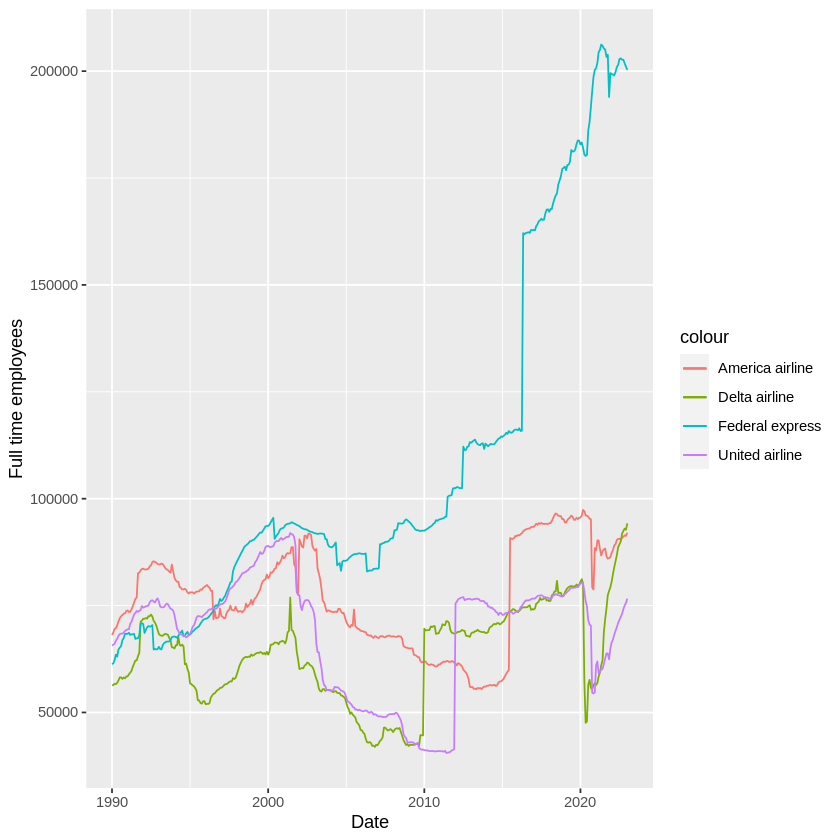

In [4]:

merged_tibble$Date <- paste(merged_tibble$Year, merged_tibble$Month, sep="-") |>
                    paste('-01', sep='') |>
                    as.Date()

#Since this is not a date due to the lack of 
#a %d in the column is added a 02 value which stands for the day, choosen to be the 2 but ininfluent

ggplot() + 
    geom_line(data = merged_tibble, aes(Date, y = Full_time_america, colour='America airline')) +
    geom_line(data = merged_tibble, aes(Date, y = Full_time_delta,   colour='Delta airline')) +
    geom_line(data = merged_tibble, aes(Date, y = Full_time_federal, colour='Federal express')) +
    geom_line(data = merged_tibble, aes(Date, y = Full_time_united, colour='United airline')) +
    xlab(label='Date') +
    ylab(label='Full time employees') 


### Part time

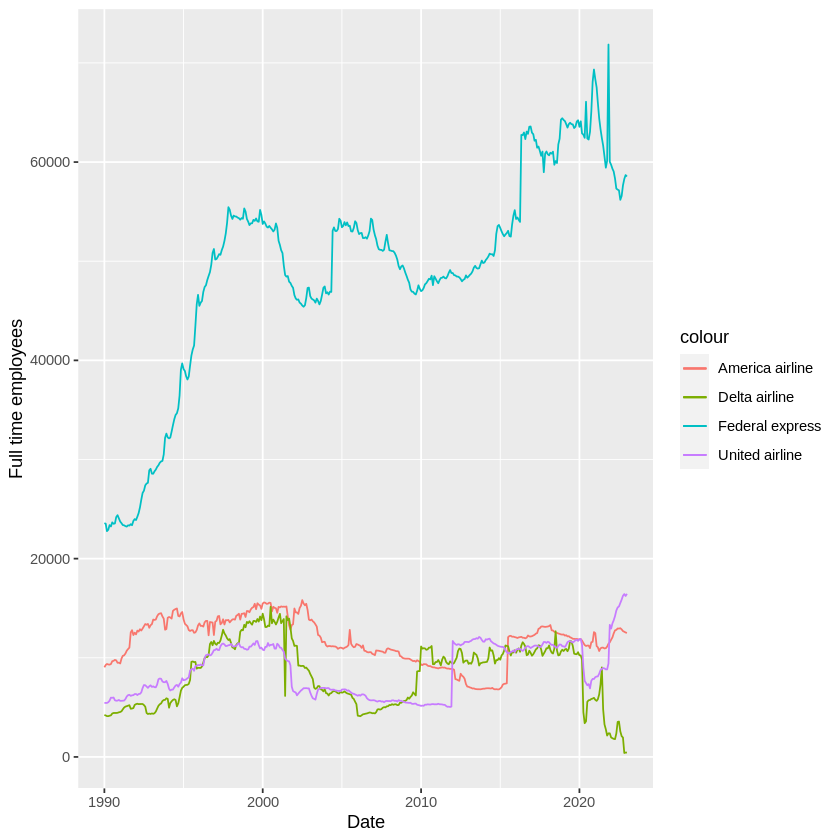

In [5]:
# Part time
merged_tibble|>
ggplot() +
    geom_line(aes(x=Date, y=Part_time_america, colour='America airline'))+
    geom_line(aes(x=Date, y=Part_time_delta, colour='Delta airline'))+
    geom_line(aes(x=Date, y=Part_time_federal, colour='Federal express'))+
    geom_line(aes(x=Date, y=Part_time_united, colour='United airline'))+ 
    xlab(label='Date') +
    ylab(label='Full time employees') 

## 4) when did each company reach the minimum and maximum number of employess ?

### Plot of the total employees

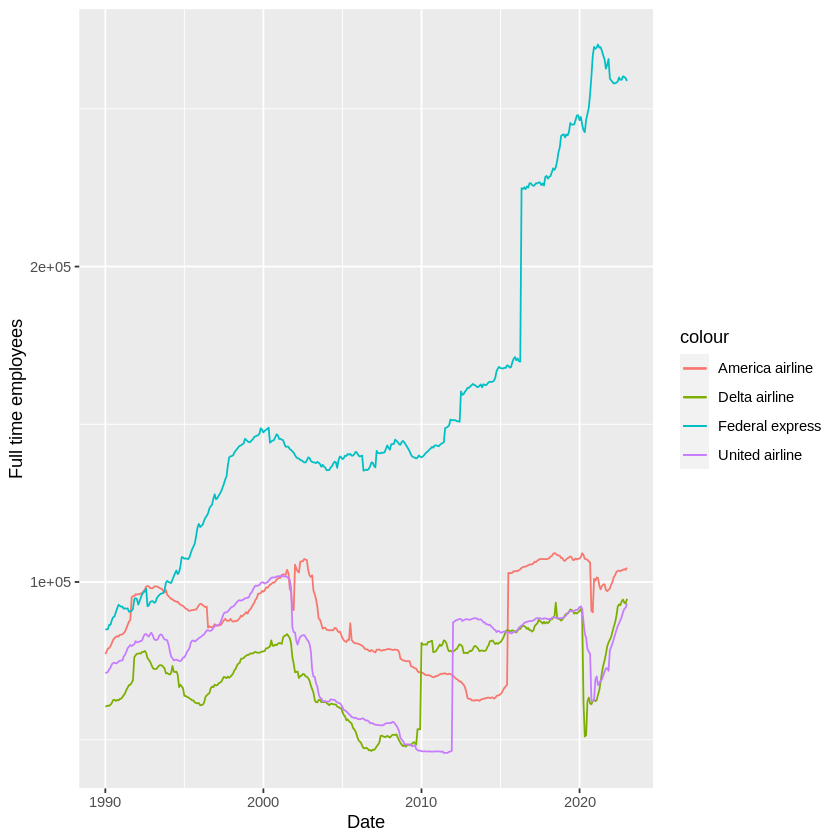

In [6]:
merged_tibble|>
ggplot() +
    geom_line(aes(x=Date, y=Grand_total_america, colour='America airline'))+
    geom_line(aes(x=Date, y=Grand_total_delta, colour='Delta airline'))+
    geom_line(aes(x=Date, y=Grand_total_federal, colour='Federal express'))+
    geom_line(aes(x=Date, y=Grand_total_united, colour='United airline'))+ 
    xlab(label='Date') +
    ylab(label='Full time employees') 

In [7]:
company_name <- c('America', 'Delta', 'Federal', 'United')
for (i in seq(5, 14, 3)){
    minimum_employees <- min(merged_tibble[,i]) 
    minimum_date <- filter(merged_tibble, merged_tibble[,i] == minimum_employees) |> select('Date')  
    minimum_date<-minimum_date[[1,1]]

    maximum_employees <- max(merged_tibble[,i])
    maximum_date <- filter(merged_tibble, merged_tibble[,i] == maximum_employees) |> select('Date')  
    maximum_date<-maximum_date[[1,1]]
    
    cat(str_remove(colnames(merged_tibble[,i]), 'Grand_total_'), 'minimum number of employees:', minimum_employees, 'in date:', toString(minimum_date), '\n', 
    str_remove(colnames(merged_tibble[,i]), 'Grand_total_'), 'maximum number of employees:', maximum_employees, 'in date:', toString(maximum_date), '\n')
}

Warning message:
“Using one column matrices in `filter()` was deprecated in dplyr 1.1.0.
ℹ Please use one dimensional logical vectors instead.”


america minimum number of employees: 62290 in date: 2013-09-01 
 america maximum number of employees: 109171 in date: 2018-06-01 
delta minimum number of employees: 46410 in date: 2006-11-01 
 delta maximum number of employees: 94675 in date: 2023-01-01 
federal minimum number of employees: 84885 in date: 1990-01-01 
 federal maximum number of employees: 270383 in date: 2021-03-01 
united minimum number of employees: 45781 in date: 2011-06-01 
 united maximum number of employees: 102046 in date: 2001-03-01 


## 5) plot the fraction of part-time worker over the total employess as a function of time

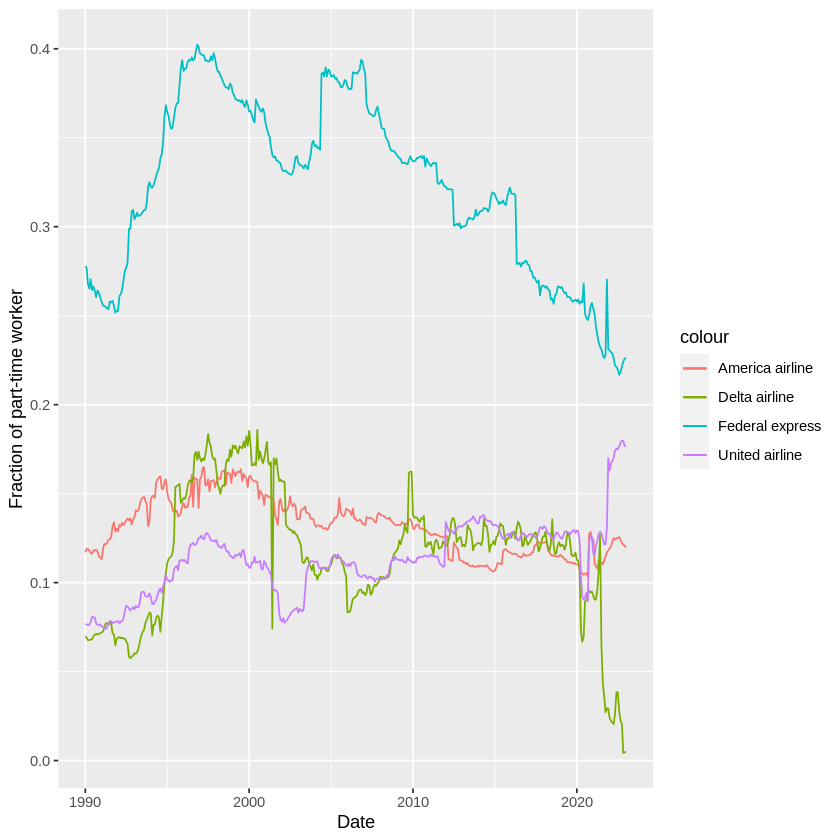

In [8]:
merged_tibble |>
    ggplot() +
    geom_line(aes(x=Date, y=Part_time_america/Grand_total_america, colour='America airline')) +
    geom_line(aes(x=Date, y=Part_time_delta/Grand_total_delta, colour='Delta airline')) +
    geom_line(aes(x=Date, y=Part_time_federal/Grand_total_federal, colour='Federal express')) +
    geom_line(aes(x=Date, y=Part_time_united/Grand_total_united, colour='United airline')) +
    labs(x='Date', y='Fraction of part-time worker') 

## 6) did the COVID-19 pandemic have any influence in the employed workers of the airline companies ? Can you see a trend in the years 2019-2023 ?

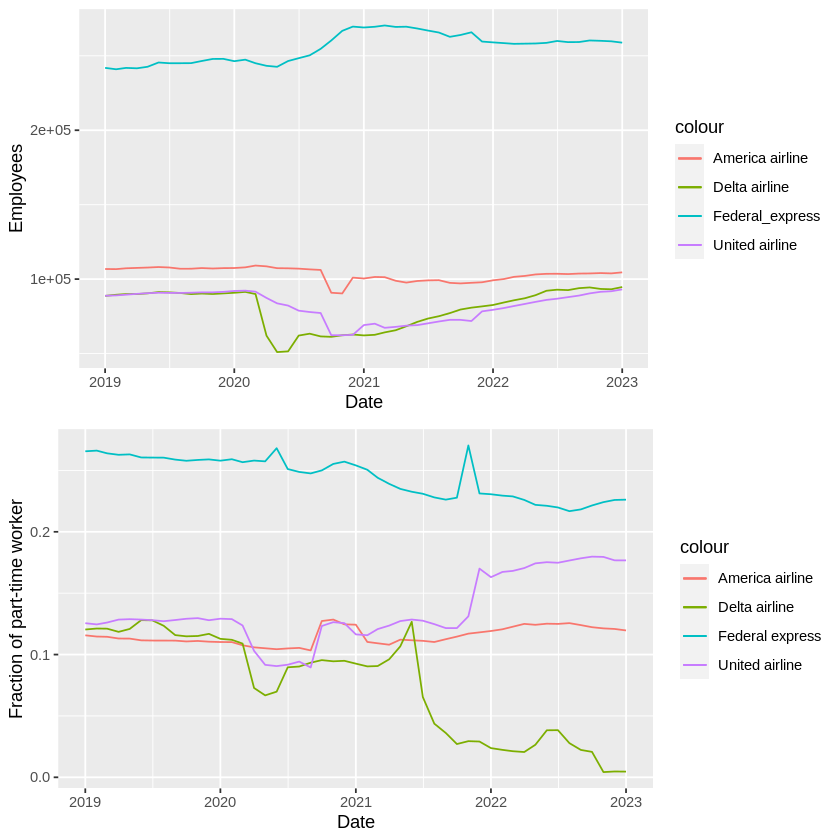

In [9]:
merged_tibble |>
    filter(Year > 2018) |>
    ggplot()+
    geom_line(aes(x=Date, y=Grand_total_america, colour='America airline')) +
    geom_line(aes(x=Date, y=Grand_total_delta, colour='Delta airline')) +
    geom_line(aes(x=Date, y=Grand_total_federal, colour='Federal_express'))+
    geom_line(aes(x=Date, y=Grand_total_united, colour='United airline'))+
    labs(x='Date', y='Employees') -> total

merged_tibble |>
    filter(Year > 2018) |>
    ggplot() +
    geom_line(aes(x=Date, y=Part_time_america/Grand_total_america, colour='America airline')) +
    geom_line(aes(x=Date, y=Part_time_delta/Grand_total_delta, colour='Delta airline')) +
    geom_line(aes(x=Date, y=Part_time_federal/Grand_total_federal, colour='Federal express')) +
    geom_line(aes(x=Date, y=Part_time_united/Grand_total_united, colour='United airline')) +
    labs(x='Date', y='Fraction of part-time worker') -> frac

grid.arrange(total, frac, ncol = 1, nrow = 2)

For America Delta and United airline the covid pandemic period (2019-2023) is characterized by a decrease in the total number of employees. Federal express does not show this trend. The part-time fraction of employees does show the decreasing trend for Delta and Federal, but for Federal this does not seemes to be related to the covid pandemic since the decrease has begun in 2005.

# EX.2 Data Frames and Tibble

In [10]:
install.packages('nycflights13')
library(nycflights13)

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [61]:
flights

year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour,date
<int>,<int>,<int>,<int>,<int>,<dbl>,<int>,<int>,<dbl>,<chr>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dttm>,<date>
2013,1,1,517,515,2,830,819,11,UA,1545,N14228,EWR,IAH,227,1400,5,15,2013-01-01 05:00:00,2013-01-01
2013,1,1,533,529,4,850,830,20,UA,1714,N24211,LGA,IAH,227,1416,5,29,2013-01-01 05:00:00,2013-01-01
2013,1,1,542,540,2,923,850,33,AA,1141,N619AA,JFK,MIA,160,1089,5,40,2013-01-01 05:00:00,2013-01-01
2013,1,1,544,545,-1,1004,1022,-18,B6,725,N804JB,JFK,BQN,183,1576,5,45,2013-01-01 05:00:00,2013-01-01
2013,1,1,554,600,-6,812,837,-25,DL,461,N668DN,LGA,ATL,116,762,6,0,2013-01-01 06:00:00,2013-01-01
2013,1,1,554,558,-4,740,728,12,UA,1696,N39463,EWR,ORD,150,719,5,58,2013-01-01 05:00:00,2013-01-01
2013,1,1,555,600,-5,913,854,19,B6,507,N516JB,EWR,FLL,158,1065,6,0,2013-01-01 06:00:00,2013-01-01
2013,1,1,557,600,-3,709,723,-14,EV,5708,N829AS,LGA,IAD,53,229,6,0,2013-01-01 06:00:00,2013-01-01
2013,1,1,557,600,-3,838,846,-8,B6,79,N593JB,JFK,MCO,140,944,6,0,2013-01-01 06:00:00,2013-01-01


## 1.1) Plot the total number of flights departed from each of the three NYC airports as a function of time (one entry for each of the 365 days of the year).

In [62]:
#add the column with the date as a single column
flights$date <- make_date(year=flights$year, month=flights$month, day=flights$day) 

#count the number of flight in the same day from the same airport
by_origin <- flights |> count(origin, date) 
colnames(by_origin)[3] = 'n_flights'

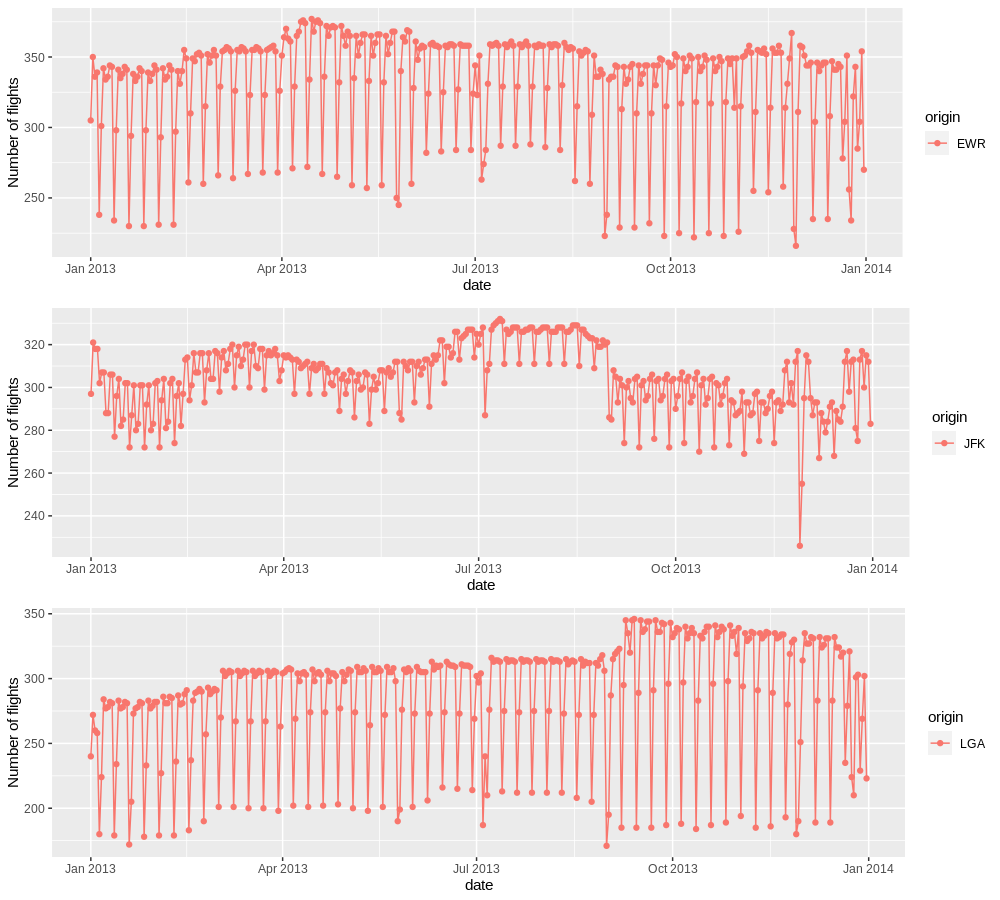

In [13]:
#plot 
by_origin |> 
        filter(origin=='JFK') |>
        ggplot() +
        geom_point(aes(x=date, y=n_flights, colour=origin)) +
        geom_line(aes(x=date, y=n_flights, colour=origin)) +
        labs(x='date', y='Number of flights') -> n_flights_JFK

by_origin |> 
        filter(origin=='EWR') |>
        ggplot() +
        geom_point(aes(x=date, y=n_flights, colour=origin)) +
        geom_line(aes(x=date, y=n_flights, colour=origin))  +
        labs(x='date', y='Number of flights') -> n_flights_EWR

by_origin |> 
        filter(origin=='LGA') |>
        ggplot() +
        geom_point(aes(x=date, y=n_flights, colour=origin)) +
        geom_line(aes(x=date, y=n_flights, colour=origin)) +
        labs(x='date', y='Number of flights') -> n_flights_LGA

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100) 
grid.arrange(n_flights_EWR, n_flights_JFK, n_flights_LGA, nrow=3)

## 1.2) Plot the average number of flights computed over the first five working days of each week as a function of the week number of the year. Produce the same plot for the flights departing over the weekend (Saturdays and Sundays)

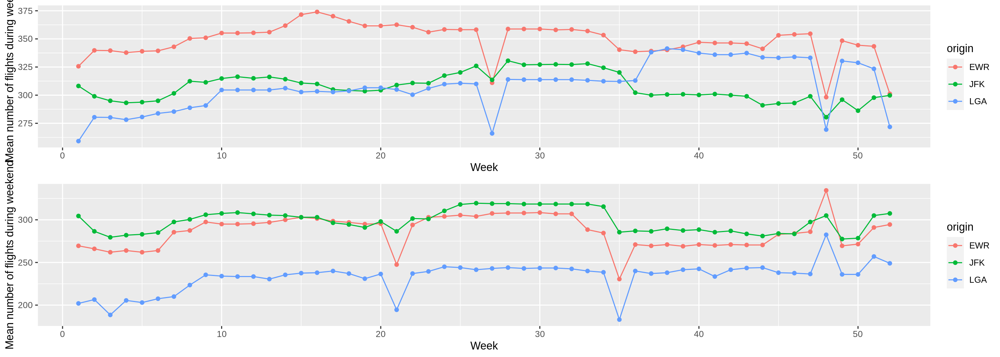

In [63]:
by_origin$week_day <-  wday(by_origin$date, week_start = 1)
by_origin$week_number <- isoweek(by_origin$date)

week_flights <- by_origin |>
                filter(week_day < 6) |>
                group_by(week_number, origin) |>
                summarize(mean_flights = mean(n_flights), .groups='drop') |>
                ggplot() +
                geom_line(aes(x=week_number, y=mean_flights, colour=origin)) +
                geom_point(aes(x=week_number, y=mean_flights, colour=origin)) +
                labs(x='Week', y='Mean number of flights during week')

weekend_flights <- by_origin |>
                filter(week_day > 5) |> 
                group_by(week_number, origin) |>
                summarize(average_flights = mean(n_flights), .groups = 'drop') |>
                ggplot() +
                geom_line(aes(x=week_number, y=average_flights, colour=origin)) +
                geom_point(aes(x=week_number, y=average_flights, colour=origin)) +
                labs(x='Week', y='Mean number of flights during weekend')

grid.arrange(week_flights,weekend_flights, ncol = 1, nrow = 2, heights=c(10,10))

## 2.1) For each flight in the data frame, compute the departure delay1 and extract the following pieces of information (separately for each NYC airport): - min, max and average delay for each day of the year (show the data in corresponding plots)

### Minimum delay for each day

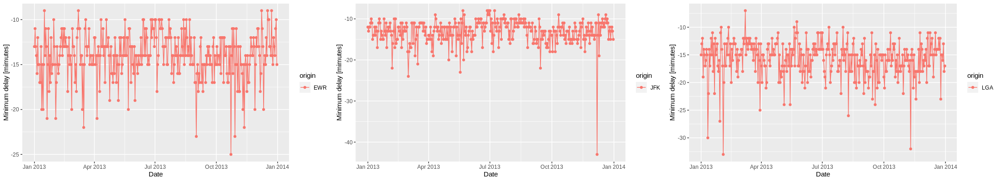

In [15]:
for (i in c('JFK', 'EWR', 'LGA')){
    if (i=='JFK'){
        flights |>
            drop_na(dep_delay) |>
            filter(origin==i) |>
            group_by(origin, date) |>
            summarize(min_delay = min(dep_delay), .groups = 'drop') |>
            ggplot() +
            geom_point(aes(x=date, y=min_delay, colour=origin))+
            geom_line(aes(x=date, y=min_delay, colour=origin)) +                    
            labs(x='Date', y='Minimum delay [mimutes]') -> min_delay_JFK
        
    } else if(i=='EWR'){
        flights |>
            drop_na(dep_delay) |>
            filter(origin==i) |>
            group_by(origin, date) |>
            summarize(min_delay = min(dep_delay), .groups = 'drop') |>
            ggplot() +
            geom_point(aes(x=date, y=min_delay, colour=origin))+
            geom_line(aes(x=date, y=min_delay, colour=origin)) +                    
            labs(x='Date', y='Minimum delay [mimutes]') -> min_delay_EWR
        
    } else if (i=='LGA'){
        flights |>
            drop_na(dep_delay) |>
            filter(origin==i) |>
            group_by(origin, date) |>
            summarize(min_delay = min(dep_delay), .groups = 'drop') |>
            ggplot() +
            geom_point(aes(x=date, y=min_delay, colour=origin))+
            geom_line(aes(x=date, y=min_delay, colour=origin)) +                    
            labs(x='Date', y='Minimum delay [mimutes]') -> min_delay_LGA
    }
}
options(repr.plot.width = 22, repr.plot.height = 4, repr.plot.res = 100) 
grid.arrange(min_delay_EWR, min_delay_JFK, min_delay_LGA, nrow=1)

### Maximum delay for each day

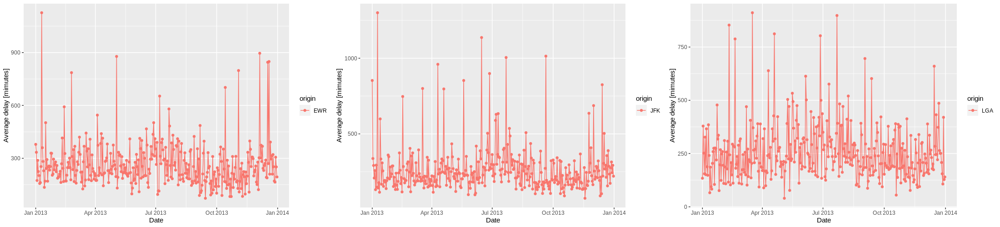

In [16]:
for (i in c('JFK', 'EWR', 'LGA')){
    if (i=='JFK'){
        flights |>
            drop_na(dep_delay) |>
            filter(origin==i) |>
            group_by(origin, date) |>
            summarize(max_delay = max(dep_delay), .groups = 'drop') |>
            ggplot() +
            geom_point(aes(x=date, y=max_delay, colour=origin))+
            geom_line(aes(x=date, y=max_delay, colour=origin)) +                    
            labs(x='Date', y='Average delay [mimutes]') -> max_delay_JFK
        
    } else if(i=='EWR'){
        flights |>
            drop_na(dep_delay) |>
            filter(origin==i) |>
            group_by(origin, date) |>
            summarize(max_delay = max(dep_delay), .groups = 'drop') |>
            ggplot() +
            geom_point(aes(x=date, y=max_delay, colour=origin))+
            geom_line(aes(x=date, y=max_delay, colour=origin)) +                    
            labs(x='Date', y='Average delay [mimutes]') -> max_delay_EWR
        
    } else if (i=='LGA'){
        flights |>
            drop_na(dep_delay) |>
            filter(origin==i) |>
            group_by(origin, date) |>
            summarize(max_delay = max(dep_delay), .groups = 'drop') |>
            ggplot() +
            geom_point(aes(x=date, y=max_delay, colour=origin))+
            geom_line(aes(x=date, y=max_delay, colour=origin)) +                    
            labs(x='Date', y='Average delay [mimutes]') -> max_delay_LGA
    }
}
options(repr.plot.width = 22, repr.plot.height = 5, repr.plot.res = 100) 
grid.arrange(max_delay_EWR, max_delay_JFK, max_delay_LGA, nrow=1)

### Average delay 

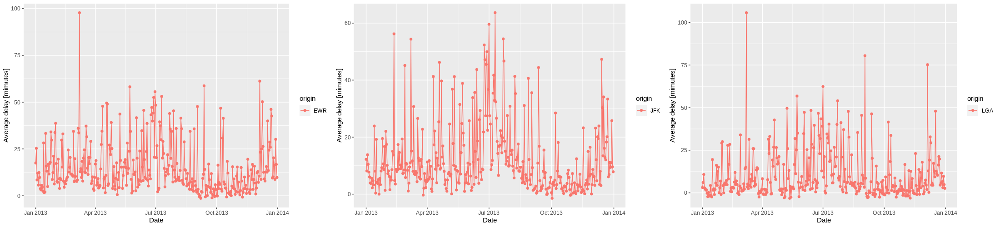

In [17]:
for (i in c('JFK', 'EWR', 'LGA')){
    if (i=='JFK'){
        flights |>
            drop_na(dep_delay) |>
            filter(origin==i) |>
            group_by(origin, date) |>
            summarize(average_delay = mean(dep_delay), .groups = 'drop') |>
            ggplot() +
            geom_point(aes(x=date, y=average_delay, colour=origin))+
            geom_line(aes(x=date, y=average_delay, colour=origin)) +                    
            labs(x='Date', y='Average delay [mimutes]') -> average_delay_JFK
        
    } else if(i=='EWR'){
        flights |>
            drop_na(dep_delay) |>
            filter(origin==i) |>
            group_by(origin, date) |>
            summarize(average_delay = mean(dep_delay), .groups = 'drop') |>
            ggplot() +
            geom_point(aes(x=date, y=average_delay, colour=origin))+
            geom_line(aes(x=date, y=average_delay, colour=origin)) +                    
            labs(x='Date', y='Average delay [mimutes]') -> average_delay_EWR
        
    } else if (i=='LGA'){
        flights |>
            drop_na(dep_delay) |>
            filter(origin==i) |>
            group_by(origin, date) |>
            summarize(average_delay = mean(dep_delay), .groups = 'drop') |>
            ggplot() +
            geom_point(aes(x=date, y=average_delay, colour=origin))+
            geom_line(aes(x=date, y=average_delay, colour=origin)) +                    
            labs(x='Date', y='Average delay [mimutes]') -> average_delay_LGA
    }
}
options(repr.plot.width = 22, repr.plot.height = 5, repr.plot.res = 100) 
grid.arrange(average_delay_EWR, average_delay_JFK, average_delay_LGA, nrow=1)

## 3) Assuming the distance flew by the plane is, at first approximation, the distance between the two connecting airports (as given in the data frame), compute the average speed of each plane. Produce a plot of the average plane speed as a function of departure day of the year 

* air_time is in minutes
* distance is in mile (those savages) -> 1 mile ~ 1.61 km

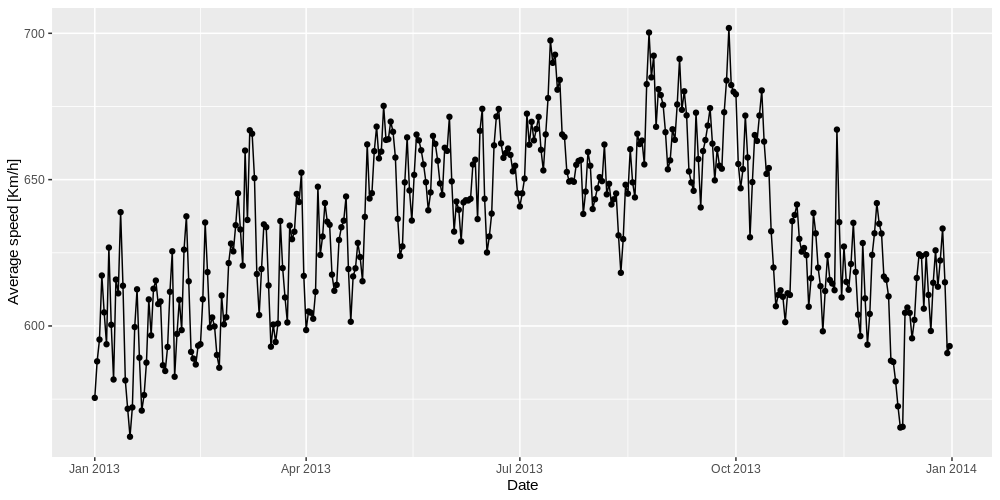

In [18]:
flights |>
    drop_na(air_time) |>
    group_by(date) |>
    summarize(average_speed = mean((distance*1.61)/(air_time/60))) |>
    ggplot() +
    geom_point(aes(x=date, y=average_speed)) + 
    geom_line(aes(x=date, y=average_speed)) +
    labs(x='Date', y='Average speed [Km/h]')-> average_speed

options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 100) 
average_speed

#if i need the column with the speed
# flights$speed <- (flights$distance*1.61)/(flights$air_time/60)
# flights |>
#     drop_na(air_time) |>
#     group_by(date) |>
#     summarize(average_speed = mean(speed) |>
#     ggplot() +
#     geom_point(aes(x=date, y=average_speed)) +
#     labs()

## 4) Analyze the flights offered by each airline company and determine:
- the airline companies offering the largest two numbers of flights per day and per week;
- the airline company offering the smallest number of flight per month;
- the airline company offering the longest distance flight per month.
- (you can produce plots, if you like, to visualize the results of the analysis)

### The airline companies offering the largest two numbers of flights per day and week

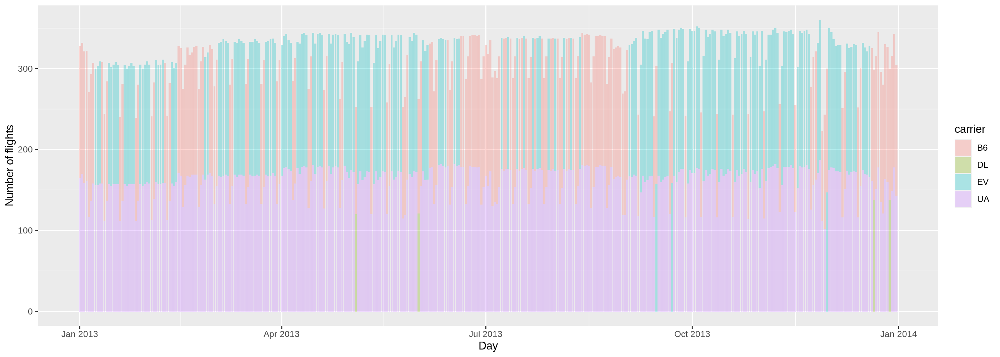

In [65]:
flights |>
    group_by(date) |>
    count(carrier, date) |>
    slice_max(n, n=2, with_ties = FALSE) |> 
    ggplot(aes(x=date, fill=carrier, y=n))+
    geom_bar(position = "stack",stat="identity", alpha=.3) +
    labs(x='Day',y='Number of flights')

options(repr.plot.width = 14, repr.plot.height = 5) 

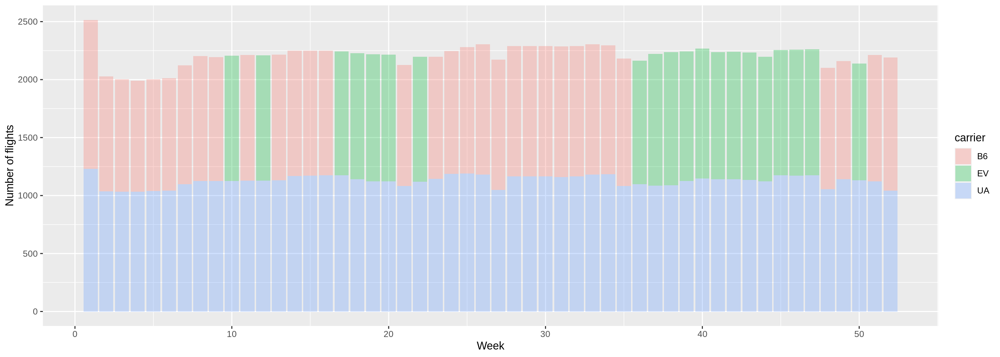

In [71]:
flights$week_number <- isoweek(flights$date)
flights |>
    group_by(week_number) |>
    count(carrier, week_number) |>
    slice_max(n, n=2, with_ties = FALSE) |> 
    ggplot(aes(x=week_number, fill=carrier, y=n))+
    geom_bar(position = "stack",stat="identity", alpha=.3) +
    labs(x='Week',y='Number of flights')

options(repr.plot.width = 14, repr.plot.height = 5) 

### The airline company offering the smallest number of flight per month

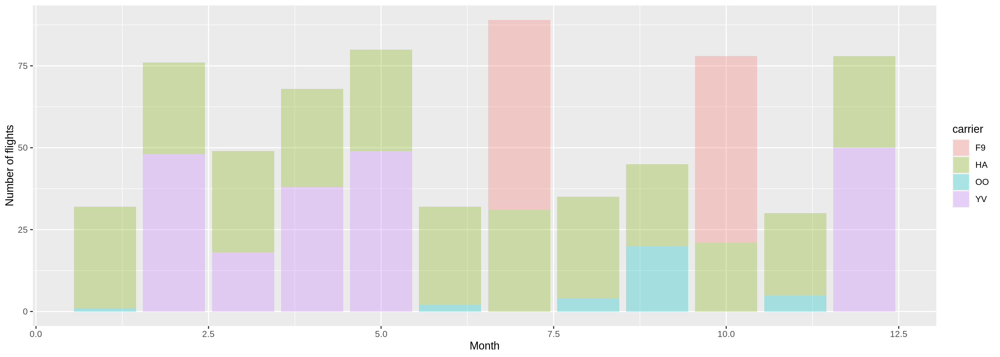

In [72]:
flights |> 
    group_by(month)|>
    count(month, carrier) |>
    slice_min(n, n=2, with_ties = FALSE) |>
    ggplot(aes(x=month, fill=carrier, y=n))+
    geom_bar(position='stack', stat='identity', alpha=.3) +
    labs(x='Month', y='Number of flights')
    

### The airline company offering the longest distance flight per month.


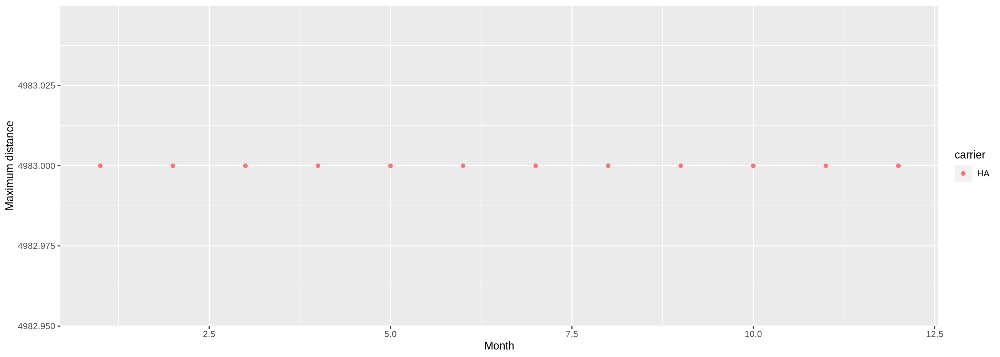

In [101]:
flights |>
    group_by(month, carrier) |>
    summarize(n=max(distance), .groups='drop') |>
    slice_max(n, n=1) |>
    ggplot() +
    geom_point(aes(x=month, y=n, colour=carrier)) +
    labs(x='Month', y='Maximum distance')